## Final Project Submission

Please fill out:
* Student name: Viktoria Szontagh
* Student pace: full time
* Scheduled project review date/time: 
* Instructor name: Joseph Mata
* Blog post URL:


In [157]:
# Your code here - remember to use markdown cells for comments as well!
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from scipy.stats import norm

#map
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings('ignore')

In [2]:
#loading the data set
df = pd.read_csv('data/kc_house_data.csv')

In [3]:
# checking the content of the dataframe
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,...,8 Good,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,...,8 Good,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,...,7 Average,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,NONE,...,8 Good,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


### Basic information about the dataset

In [4]:
# checking basic information about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

The data file has 21597 rows, and 21 columns. Some of the rows has missing information: waterfront, view, yr_renovated. Most of the data types are int and float type, there are 6 of them  with categorical values. The date column should be in datatype, I will change this in the followings. Similarily yr_built represent the year when the house was built, this should be a datetype as well.

In [5]:
numeric = ['price', 'bedrooms','bathrooms','sqft_living','sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'yr_built', 'sqft_living15', 'sqft_lot15']
ordinal = ['grade', 'condition']
categorical = ['waterfront', 'view', 'zipcode','yr_built']

In [6]:
# distribution of numeric features
#fig, ax = plt.subplots(figsize = (12,12))
#sns.histplot(data=df[numeric], x= 'price')

In [7]:
# checking the number of missing information
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

There are 3 columns that has missing information, namely: waterfront, view and yr_renovated.

In [8]:
# checking the summary statistic
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Based on the above summary statistics, the following infromations stands out:
- There are outliers in the number of bedrooms, the max value is 33. This need to be further investigated and later on it might be remove.
- Bathrooms seemingly has outlier too with 8 bathrooms, when the iqr 75% is only 2.5.
- srft_living, sqft_above and sqft_lot15 also seems to have outliers based on it's max value (13540, 9410 and 871200). These also need to be investigated.
- There are lot of missing values in yr_renovated.


Text(0, 0.5, 'Sales Price')

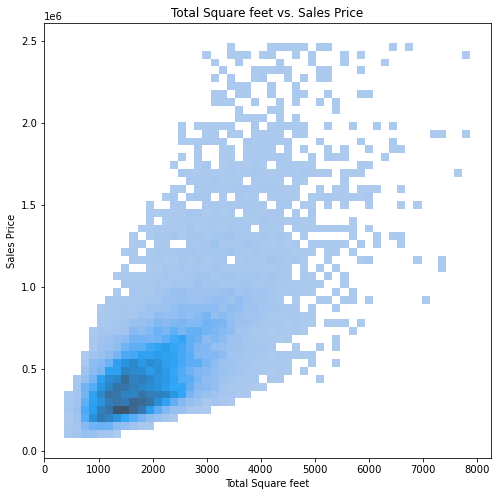

In [182]:
# sqft_living vs price 
fig, ax = plt.subplots(figsize = (8,8))
sns.histplot(data =df, x ='sqft_living', y='price', bins = 50)
ax.set_title('Total Square feet vs. Sales Price')
ax.set_xlabel('Total Square feet')
ax.set_ylabel('Sales Price')

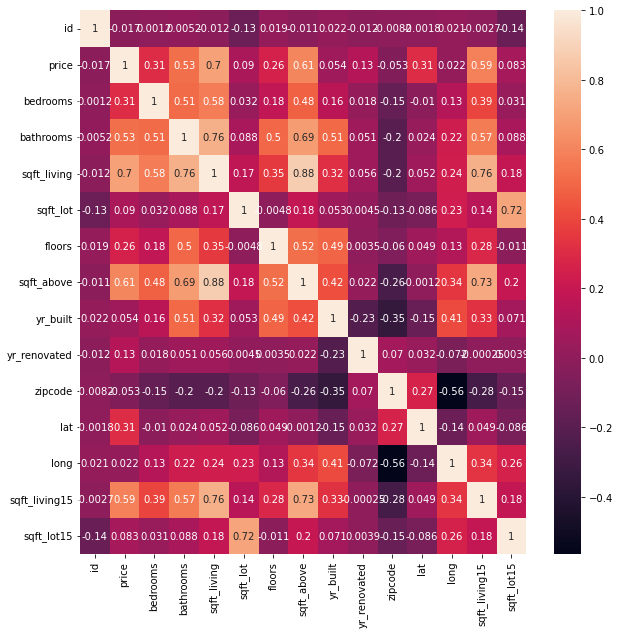

In [9]:
# Checking the preliminary correlation
fig, ax = plt.subplots(figsize = (10,10))
corr = df.corr()
sns.heatmap(corr, cmap = 'rocket', annot = True)
plt.show()

sqft_living has the highest correlation with price 0.7, following sqft_bove with 0.61.
The sqft_living seems to be the sum of sqft_above and sqft_basement, this might be droped later on to avoide multicollinearity.

Text(0, 0.5, 'House Sales Price')

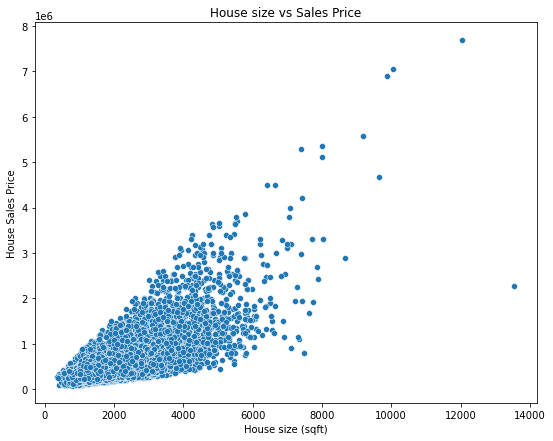

In [10]:
#outliers = df['bedrooms','bathrooms', 'sqft_living','sqft_lot', 'price']
fig, ax = plt.subplots(figsize = (9,7))
sns.scatterplot(data = df, x='sqft_living', y ='price')
ax.set_title('House size vs Sales Price')
ax.set_xlabel('House size (sqft)')
ax.set_ylabel('House Sales Price')

### Checking the values of the object datatypes

In [11]:
# checking how many values under waterfront
df['waterfront'].value_counts()

NO     19075
YES      146
Name: waterfront, dtype: int64

In [12]:
# checking how many values under view
df['view'].value_counts()
# this should be ordinal variable, I will replace the text with numerice values


NONE         19422
AVERAGE        957
GOOD           508
FAIR           330
EXCELLENT      317
Name: view, dtype: int64

In [13]:
# checking how many values under condition
df['condition'].value_counts()

Average      14020
Good          5677
Very Good     1701
Fair           170
Poor            29
Name: condition, dtype: int64

In [14]:
# checking how many values under grade
df['grade'].value_counts()

7 Average        8974
8 Good           6065
9 Better         2615
6 Low Average    2038
10 Very Good     1134
11 Excellent      399
5 Fair            242
12 Luxury          89
4 Low              27
13 Mansion         13
3 Poor              1
Name: grade, dtype: int64

In [15]:
df['sqft_basement'].value_counts()

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1920.0        1
3480.0        1
2730.0        1
2720.0        1
248.0         1
Name: sqft_basement, Length: 304, dtype: int64

In [16]:
df['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

In [17]:
# removing the string value after the number in grade
df['grade'] = df['grade'].str.split().str[0]
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [18]:
# changing the datatype of date to date
df['date'] = pd.to_datetime(df['date'])

In [19]:
# changing the the floors cols to integer
df['floors'] = df['floors'].astype(int)

In [20]:
# replacing missing values in the waterfront column to 'NO'
df['waterfront'].fillna('NO', inplace = True)

In [21]:
# replacing missing values in the view column to 'NONE'
df['view'].fillna('NONE', inplace = True)

In [22]:
# replacing missing data with 0 in yr-renovated, assuming they have not been renovated
# later I will make a new boolean column if it has or not has renovation, and drop this col
df['yr_renovated'].fillna(0, inplace = True)

In [23]:
# changing the view categories into numeric values to represent ordinality
df['view'] = df['view'].replace(['NONE','AVERAGE','GOOD', 'FAIR', 'EXCELLENT'],[1,2,3,4,5])

In [24]:
df['view'].value_counts()

1    19485
2      957
3      508
4      330
5      317
Name: view, dtype: int64

In [25]:
# changing the condition to numeric values
df['condition'] = df['condition'].replace(['Poor','Fair', 'Average', 'Good', 'Very Good'],[1,2,3,4,5])

In [26]:
# replacing the no and yes values in waterfront with 0 and 1
# changing the condition to numeric values
df['waterfront'] = df['waterfront'].replace(['NO','YES'],[0,1])

In [27]:
# changing the data type to category for condition
df['condition'] = df['condition'].astype("category")
df['view'] = df['view'].astype("category")
df['grade'] = df['grade'].astype("category")
df['waterfront'] = df['waterfront'].astype('category')

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   price          21597 non-null  float64       
 3   bedrooms       21597 non-null  int64         
 4   bathrooms      21597 non-null  float64       
 5   sqft_living    21597 non-null  int64         
 6   sqft_lot       21597 non-null  int64         
 7   floors         21597 non-null  int64         
 8   waterfront     21597 non-null  category      
 9   view           21597 non-null  category      
 10  condition      21597 non-null  category      
 11  grade          21597 non-null  category      
 12  sqft_above     21597 non-null  int64         
 13  sqft_basement  21597 non-null  object        
 14  yr_built       21597 non-null  int64         
 15  yr_renovated   2159

In [29]:
# replacing missing data with 0 in yr-renovated, assuming they have not been renovated
df['yr_renovated'].fillna(0, inplace = True)

In [30]:
df['yr_renovated'].value_counts()

0.0       20853
2014.0       73
2013.0       31
2003.0       31
2007.0       30
          ...  
1951.0        1
1953.0        1
1946.0        1
1976.0        1
1948.0        1
Name: yr_renovated, Length: 70, dtype: int64

In [31]:
# due to the lot of missing values, I will convert this to boolean, whether it had been renovated or not
#df['yr_renovated'] = df['yr_renovated'].astype(int)
df['renovated'] = None
for i in range(len(df)):
    if df['yr_renovated'][i] == 0:
        df['renovated'][i] = 0
    else:
        df['renovated'][i] = 1

In [ ]:
#changing the datatype
df['renovated'] = df['renovated'].astype(int)

In [32]:
# drop yr_renovated column
df.drop('yr_renovated', axis = 1, inplace = True)

In [33]:
#droping the id col
df.drop('id', axis = 1, inplace=True)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           21597 non-null  datetime64[ns]
 1   price          21597 non-null  float64       
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  int64         
 7   waterfront     21597 non-null  category      
 8   view           21597 non-null  category      
 9   condition      21597 non-null  category      
 10  grade          21597 non-null  category      
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  object        
 13  yr_built       21597 non-null  int64         
 14  zipcode        21597 non-null  int64         
 15  lat            2159

In [35]:
# replace '?' in sqft_basement
df['sqft_basement'] = df['sqft_basement'].apply(lambda x: x.replace('?', '0'))
df['sqft_basement'] = df['sqft_basement'].apply(lambda x: x.replace('0.0', '0'))

In [36]:
# changing the datatype to int
df['sqft_basement'] = df['sqft_basement'].astype(float)
df['sqft_basement'] = df['sqft_basement'].astype(int)

In [37]:
# checking the datatype change
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           21597 non-null  datetime64[ns]
 1   price          21597 non-null  float64       
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  int64         
 7   waterfront     21597 non-null  category      
 8   view           21597 non-null  category      
 9   condition      21597 non-null  category      
 10  grade          21597 non-null  category      
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  zipcode        21597 non-null  int64         
 15  lat            2159

In [38]:
# checking if there any missining values left
df.isna().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
renovated        0
dtype: int64

In [39]:
# separating the date column to year and month
df['year'] = pd.to_datetime(df['date']).dt.year
df['month'] = pd.to_datetime(df['date']).dt.month
#droping the date column
df.drop('date', axis = 1, inplace = True)
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,renovated,year,month
0,221900.0,3,1.00,1180,5650,1,0,1,3,7,...,0,1955,98178,47.5112,-122.257,1340,5650,0,2014,10
1,538000.0,3,2.25,2570,7242,2,0,1,3,7,...,400,1951,98125,47.7210,-122.319,1690,7639,1,2014,12
2,180000.0,2,1.00,770,10000,1,0,1,3,6,...,0,1933,98028,47.7379,-122.233,2720,8062,0,2015,2
3,604000.0,4,3.00,1960,5000,1,0,1,5,7,...,910,1965,98136,47.5208,-122.393,1360,5000,0,2014,12
4,510000.0,3,2.00,1680,8080,1,0,1,3,8,...,0,1987,98074,47.6168,-122.045,1800,7503,0,2015,2


In [40]:
# changing the data type of the month 
df['month'] = df['month'].astype('category')
df['year'] = df['year'].astype('category')
df['zipcode'] = df['zipcode'].astype('category')

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   price          21597 non-null  float64 
 1   bedrooms       21597 non-null  int64   
 2   bathrooms      21597 non-null  float64 
 3   sqft_living    21597 non-null  int64   
 4   sqft_lot       21597 non-null  int64   
 5   floors         21597 non-null  int64   
 6   waterfront     21597 non-null  category
 7   view           21597 non-null  category
 8   condition      21597 non-null  category
 9   grade          21597 non-null  category
 10  sqft_above     21597 non-null  int64   
 11  sqft_basement  21597 non-null  int64   
 12  yr_built       21597 non-null  int64   
 13  zipcode        21597 non-null  category
 14  lat            21597 non-null  float64 
 15  long           21597 non-null  float64 
 16  sqft_living15  21597 non-null  int64   
 17  sqft_lot15     21597 non-null  

Text(0, 0.5, 'Sales Price')

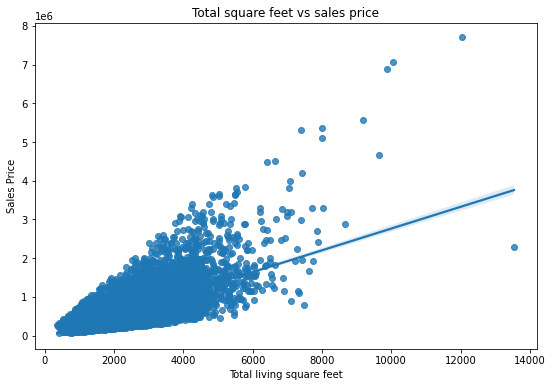

In [45]:
# square feet living vs. sales price graph 
fig, ax = plt.subplots(figsize =(9,6))
sns.regplot(data = df, x = 'sqft_living', y='price')
ax.set_title('Total square feet vs sales price')
ax.set_xlabel('Total living square feet')
ax.set_ylabel('Sales Price')

Text(0.5, 0, 'Sales Price')

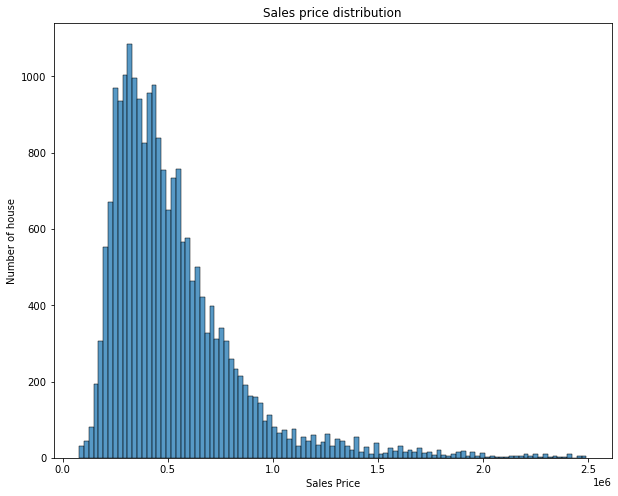

In [173]:
# sales price distribution

fig, ax = plt.subplots(figsize = (10,8))
sns.histplot(data = df, x= 'price')
ax.set_title('Sales price distribution')
ax.set_ylabel('Number of house')
ax.set_xlabel('Sales Price')


The sales price distribution is highly positively skewed with a long right tail due to outliers.


Text(0, 0.5, 'Sales Price')

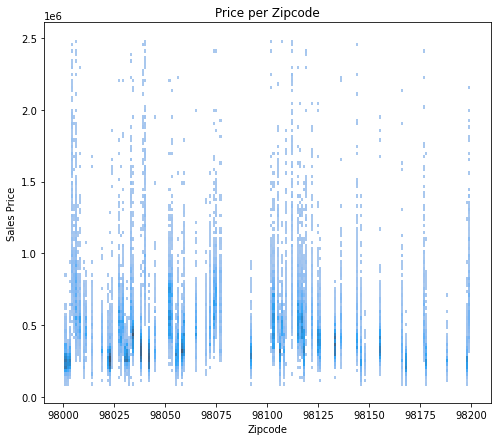

In [172]:
# checking how the location (zipcode) influences the price of a house 
fig, ax = plt.subplots(figsize=(8,7))
sns.histplot(data = df, x= 'zipcode', y='price')
ax.set_title('Price per Zipcode')
ax.set_xlabel('Zipcode')
ax.set_ylabel('Sales Price')

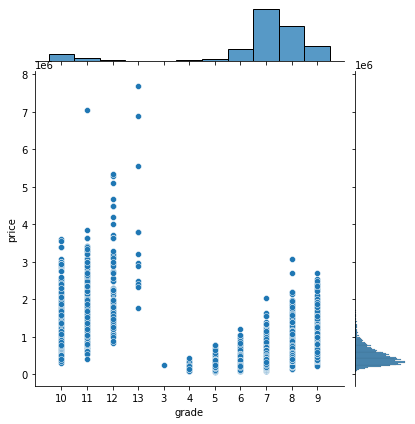

In [48]:
# checking how the overall condition of the house influences the price

p = sns.jointplot(data = df, x = 'grade', y='price')

As the graph shows as the overal grade of the house increases so as the sales price. Not surprising that in grade 12 - Luxury and 13 -Mansion are selling for the highest amounts.

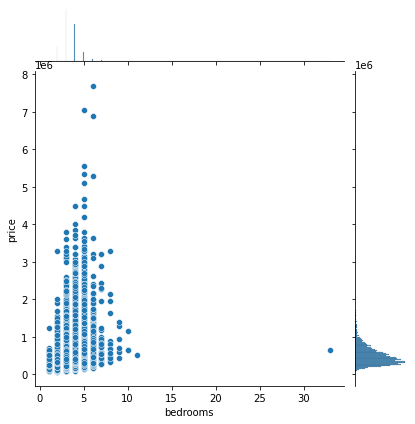

In [49]:
# checking bedrooms vs sales price
p = sns.jointplot(data = df, x = 'bedrooms', y='price')

Lot of houses with 5-6 bedrooms are on the higher end on sales price, they might be the ones with categories as luxury or mansion.

<AxesSubplot:xlabel='sqft_above', ylabel='price'>

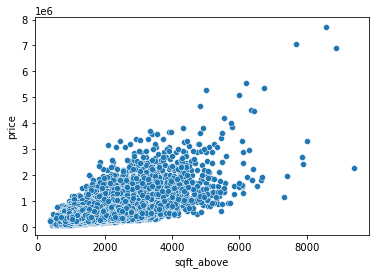

In [50]:
#checking sqft_above vs price 
sns.scatterplot(data = df, x='sqft_above', y='price')

sqft_above and price seemingly has a linear relationship. There are some outliers above 6-7000 square feet.

<AxesSubplot:xlabel='sqft_lot', ylabel='price'>

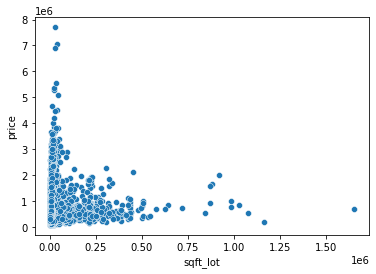

In [51]:
# sqft_lot 
sns.scatterplot(data = df, x='sqft_lot', y='price')

sqft_lot doesn't have a linear realtionship with price. This might be feature to drop later on in the model.

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   price          21597 non-null  float64 
 1   bedrooms       21597 non-null  int64   
 2   bathrooms      21597 non-null  float64 
 3   sqft_living    21597 non-null  int64   
 4   sqft_lot       21597 non-null  int64   
 5   floors         21597 non-null  int64   
 6   waterfront     21597 non-null  category
 7   view           21597 non-null  category
 8   condition      21597 non-null  category
 9   grade          21597 non-null  category
 10  sqft_above     21597 non-null  int64   
 11  sqft_basement  21597 non-null  int64   
 12  yr_built       21597 non-null  int64   
 13  zipcode        21597 non-null  category
 14  lat            21597 non-null  float64 
 15  long           21597 non-null  float64 
 16  sqft_living15  21597 non-null  int64   
 17  sqft_lot15     21597 non-null  

### Base Model

For the base model I will select the numeric columns from my dataset.

In [53]:
# select numeric columns for base model
num_cols = df.select_dtypes(include='number')
num_cols.head()


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1,1180,0,1955,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2,2170,400,1951,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,1,770,0,1933,47.7379,-122.233,2720,8062
3,604000.0,4,3.00,1960,5000,1,1050,910,1965,47.5208,-122.393,1360,5000
4,510000.0,3,2.00,1680,8080,1,1680,0,1987,47.6168,-122.045,1800,7503


In [54]:
# standardize, fit, transform the numeric columns
ss = StandardScaler()
ss.fit(num_cols)
num_cols_scaled = ss.transform(num_cols)

# create the new dataframe
scaled_new_num = pd.DataFrame(num_cols_scaled, columns = num_cols.columns, index= num_cols.index)


In [55]:
# coefficient interpretation before the scaling 
lr = LinearRegression()
model = lr.fit(num_cols.drop(['price', 'long' ,'lat'], axis = 1), num_cols['price'])

list(zip(model.coef_, num_cols.drop(['price', 'long' ,'lat'], axis = 1)))

[(-65165.75692037638, 'bedrooms'),
 (70373.39716513667, 'bathrooms'),
 (204.43363034021604, 'sqft_living'),
 (0.01865190277749207, 'sqft_lot'),
 (57895.306020175565, 'floors'),
 (45.839711185697524, 'sqft_above'),
 (53.0752025717984, 'sqft_basement'),
 (-3700.3246922448966, 'yr_built'),
 (91.73984158761596, 'sqft_living15'),
 (-0.691266208756133, 'sqft_lot15')]

Coefficient interpretation before the scaling:
- with the one unti increase of bedrooms, the price decreases by 65165 USD, this can't be right
- with the one unit increase in bathrooms the price increases by 70373 USD
- with one sqft increase the price increases by 204 USD
- with one unit increase it the year built, or the older the house gets the price decreaes by 3700 USD


In [57]:
# create the baseline model
X_stand = scaled_new_num.drop(['price', 'long' ,'lat'], axis = 1)
y = num_cols['price']

baseline_model = sm.OLS(y, sm.add_constant(X_stand))
baseline_results = baseline_model.fit()

In [58]:
# print out the baseline summary report
print(baseline_results.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.569
Model:                            OLS   Adj. R-squared:                  0.569
Method:                 Least Squares   F-statistic:                     2850.
Date:                Fri, 28 Oct 2022   Prob (F-statistic):               0.00
Time:                        11:03:02   Log-Likelihood:            -2.9830e+05
No. Observations:               21597   AIC:                         5.966e+05
Df Residuals:                   21586   BIC:                         5.967e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          5.403e+05   1641.465    329.155

In [180]:
base_r2 = 0.569

r2: The model is explaining about 57 % of the variance in price (y).
one unit increase in standard deviation of sqft_living  is increasing the sales price by 187700 USD

At a significance level of 0.05 sqft_lot (0.744) is not statisically significant 

now lets increase predictions by removing the sqft_lot 
lets increase the prediction by adding the zipcode into the model

Skew: the data are positively , highly skewed.
Kurtosis: 30.5 , shows that the data have heavy tails and that there are more outliers.

In [174]:
# coeff after scaling
model1 = lr.fit(scaled_new_num.drop(['price', 'long' ,'lat'], axis = 1), num_cols['price'])

list(zip(model1.coef_, scaled_new_num.drop(['price', 'long' ,'lat'], axis = 1)))


[(-60361.571096101594, 'bedrooms'),
 (54114.7844476965, 'bathrooms'),
 (187687.42281692784, 'sqft_living'),
 (772.4065943899386, 'sqft_lot'),
 (31937.690434629778, 'floors'),
 (37943.38991118728, 'sqft_above'),
 (23342.986110163787, 'sqft_basement'),
 (-108695.38766692171, 'yr_built'),
 (62861.47956360654, 'sqft_living15'),
 (-18853.46358469615, 'sqft_lot15')]

with every unit of increase in standard diviation in bathrooms, there is 54114 standard diviation increase in price.
I am not sure if this data makes sense

### Removing outliers

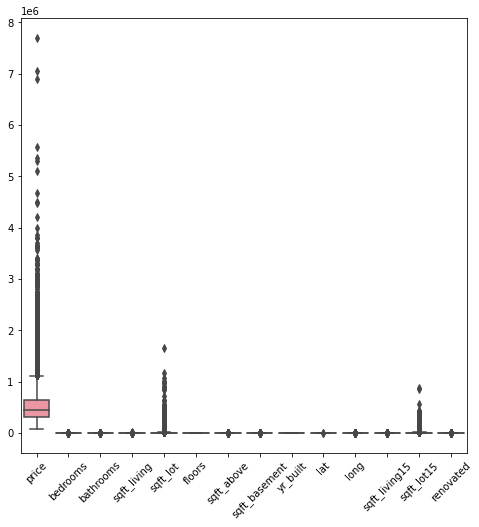

In [60]:
fig, ax = plt.subplots(figsize= (8,8))
sns.boxplot(data = df)
ax.tick_params(axis ='x', rotation = 45)

As we can see in the above boxplot, price has the most outliers. I will start checking the outliers and clean them, to make sure they don't skew our data.

In [61]:
price = df.sort_values(by='price', ascending = False)
price.head(100)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,renovated,year,month
7245,7700000.0,6,8.00,12050,27600,2,0,3,4,13,...,3480,1910,98102,47.6298,-122.323,3940,8800,1,2014,10
3910,7060000.0,5,4.50,10040,37325,2,1,2,3,11,...,2360,1940,98004,47.6500,-122.214,3930,25449,1,2014,6
9245,6890000.0,6,7.75,9890,31374,2,0,5,3,13,...,1030,2001,98039,47.6305,-122.240,4540,42730,0,2014,9
4407,5570000.0,5,5.75,9200,35069,2,0,1,3,13,...,3000,2001,98039,47.6289,-122.233,3560,24345,0,2014,8
1446,5350000.0,5,5.00,8000,23985,2,0,5,3,12,...,1280,2009,98004,47.6232,-122.220,4600,21750,0,2015,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3018,2530000.0,4,5.50,6930,45100,1,0,1,4,11,...,0,1950,98006,47.5547,-122.144,2560,37766,1,2014,9
17544,2510000.0,3,3.25,5480,57990,2,1,5,3,11,...,0,1991,98166,47.4558,-122.371,2500,22954,0,2015,4
7304,2500000.0,4,4.00,3330,24354,1,0,1,4,10,...,0,1961,98006,47.5708,-122.192,3880,25493,0,2015,4
17137,2500000.0,4,3.75,3480,14850,1,0,5,3,9,...,1610,1951,98004,47.6227,-122.216,4780,18480,1,2015,3


In [62]:
df = df[df['price'] < 2500000]


In [63]:
df['price'].max()


2490000.0

In [64]:
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,renovated,year,month
0,221900.0,3,1.00,1180,5650,1,0,1,3,7,...,0,1955,98178,47.5112,-122.257,1340,5650,0,2014,10
1,538000.0,3,2.25,2570,7242,2,0,1,3,7,...,400,1951,98125,47.7210,-122.319,1690,7639,1,2014,12
2,180000.0,2,1.00,770,10000,1,0,1,3,6,...,0,1933,98028,47.7379,-122.233,2720,8062,0,2015,2
3,604000.0,4,3.00,1960,5000,1,0,1,5,7,...,910,1965,98136,47.5208,-122.393,1360,5000,0,2014,12
4,510000.0,3,2.00,1680,8080,1,0,1,3,8,...,0,1987,98074,47.6168,-122.045,1800,7503,0,2015,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,360000.0,3,2.50,1530,1131,3,0,1,3,8,...,0,2009,98103,47.6993,-122.346,1530,1509,0,2014,5
21593,400000.0,4,2.50,2310,5813,2,0,1,3,8,...,0,2014,98146,47.5107,-122.362,1830,7200,0,2015,2
21594,402101.0,2,0.75,1020,1350,2,0,1,3,7,...,0,2009,98144,47.5944,-122.299,1020,2007,0,2014,6
21595,400000.0,3,2.50,1600,2388,2,0,1,3,8,...,0,2004,98027,47.5345,-122.069,1410,1287,0,2015,1


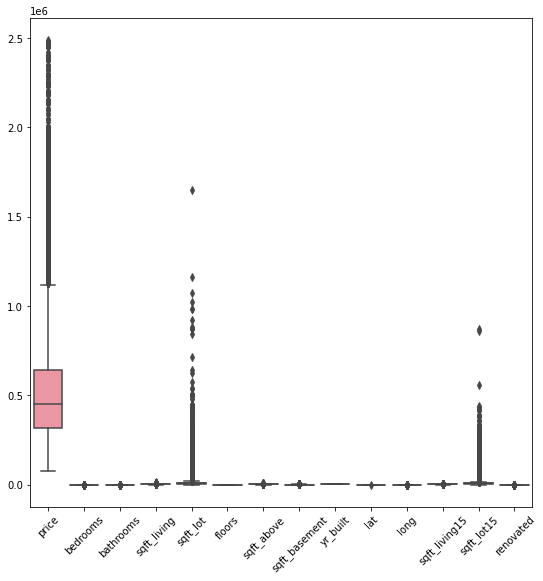

In [65]:
fig, ax = plt.subplots(figsize= (9,9))
sns.boxplot(data = df)
ax.tick_params(axis ='x', rotation = 45)

In [66]:
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,lat,long,sqft_living15,sqft_lot15
count,2.149500e+04,21495.000000,21495.000000,21495.000000,2.149500e+04,21495.000000,21495.000000,21495.000000,21495.000000,21495.000000,21495.000000,21495.000000,21495.000000
mean,5.274094e+05,3.367946,2.106397,2063.969063,1.506559e+04,1.444196,1776.445499,281.608514,1970.982833,47.559800,-122.213870,1978.707886,12730.392603
std,3.101881e+05,0.923039,0.754709,882.045179,4.149343e+04,0.551473,805.097293,432.028967,29.351006,0.138775,0.140951,675.170732,27320.056233
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,0.000000,1900.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.200000e+05,3.000000,1.500000,1420.000000,5.040000e+03,1.000000,1190.000000,0.000000,1951.000000,47.469900,-122.329000,1480.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.600000e+03,1.000000,1560.000000,0.000000,1975.000000,47.571400,-122.231000,1830.000000,7616.000000
75%,6.400000e+05,4.000000,2.500000,2540.000000,1.059100e+04,2.000000,2200.000000,540.000000,1997.000000,47.678200,-122.125000,2350.000000,10050.000000
max,2.490000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.000000,9410.000000,4130.000000,2015.000000,47.777600,-121.315000,5790.000000,871200.000000


In [67]:
# removing outliers in the bedrooms
above = df.sort_values(by='sqft_living', ascending = False)
above.head(40)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,renovated,year,month
12764,2280000.0,7,8.00,13540,307752,3,0,5,3,12,...,4130,1999,98053,47.6675,-121.986,4850,217800,0,2014,5
13398,2420000.0,5,4.75,7880,24250,2,0,2,3,13,...,0,1996,98177,47.7334,-122.362,2740,10761,0,2015,1
16759,1920000.0,5,5.75,7730,230868,2,0,1,3,12,...,1070,2004,98077,47.7615,-122.084,2660,39292,0,2015,1
14019,1680000.0,4,3.75,7620,29536,2,0,3,3,11,...,1640,2005,98006,47.5571,-122.140,2840,20809,0,2014,11
4020,800000.0,7,6.75,7480,41664,2,0,2,3,11,...,2400,1953,98166,47.4643,-122.368,2810,33190,0,2014,10
11859,1950000.0,4,3.25,7420,167869,2,0,3,3,12,...,0,2002,98045,47.4548,-121.764,5610,169549,0,2015,1
2711,1110000.0,5,3.50,7350,12231,2,0,5,3,11,...,2600,2001,98065,47.5373,-121.865,5380,12587,0,2014,7
18579,1140000.0,5,4.00,7320,217800,2,0,1,3,11,...,0,1992,98058,47.4473,-122.086,3270,34500,0,2014,7
21490,2240000.0,5,6.50,7270,130017,2,0,1,3,12,...,850,2010,98027,47.5371,-121.982,1800,44890,0,2014,5
6495,1940000.0,4,5.75,7220,223462,2,0,5,3,12,...,1000,2000,98053,47.7097,-122.013,2680,7593,0,2015,2


In [68]:
# removing any sqft_living which is greater then 9000 sqft
df= df[df['sqft_living'] < 9000]
# checking the new max value of the column
df['sqft_living'].max()

7880

In [69]:
#checking how many outliers we have for more than 6 bathrooms
len(df[df['bathrooms'] >= 6])

7

In [70]:
#removing the outliers in the bathrooms column
df=df[df['bathrooms'] <= 6]
# checking if the outlier have been removed
df['bathrooms'].max()

6.0

In [71]:
# saving the zipcode column for later use
zipcode = df['zipcode']
zipcode

0        98178
1        98125
2        98028
3        98136
4        98074
         ...  
21592    98103
21593    98146
21594    98144
21595    98027
21596    98144
Name: zipcode, Length: 21490, dtype: category
Categories (70, int64): [98001, 98002, 98003, 98004, ..., 98178, 98188, 98198, 98199]

### Train - Test Split
Splitting up the dataframe to the train and test. 
I will use the price as the targe variable.

In [72]:
# Splitting up the datafram into train - test
y = df['price']
X = df.drop(['price'], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [73]:
# check the size of train for X and y.
print(f'There are {X_train.shape[0]} rows, and {X_train.shape[1]} columns in the X train data.')
print(f'There are {y_train.shape[0]} rows in y train data.')

There are 15043 rows, and 20 columns in the X train data.
There are 15043 rows in y train data.


In [74]:
# check the size of test for X and y.
print(f'There are {X_test.shape[0]} rows, and {X_test.shape[1]} columns in the X test data.')
print(f'There are {y_test.shape[0]} rows in y test data.')

There are 6447 rows, and 20 columns in the X test data.
There are 6447 rows in y test data.


In [75]:
# check if the X and y has the same size 
X_train.shape[0] == y_train.shape[0]

True

In [104]:
X_train

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,renovated,year,month
3806,3,1.50,2210,6300,1,0,1,5,8,2210,0,1916,98144,47.5892,-122.290,2700,6300,0,2014,6
11484,3,1.00,1660,7500,1,0,1,4,7,1060,600,1940,98125,47.7105,-122.306,1450,7500,0,2014,5
11959,4,3.00,2500,6278,2,0,1,3,9,2500,0,2002,98092,47.3325,-122.168,2700,7200,0,2014,11
16201,3,2.75,2160,4086,1,0,1,3,7,1380,780,1987,98126,47.5352,-122.380,1300,4080,0,2014,12
11257,3,2.00,1990,3000,1,0,2,5,8,1430,560,1927,98144,47.5891,-122.293,1780,5000,0,2014,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,4,1.50,1500,3075,2,0,1,5,7,1420,80,1929,98103,47.6893,-122.350,1480,3774,0,2014,12
12023,2,1.75,1550,4257,1,0,3,3,7,830,720,1953,98136,47.5274,-122.384,1920,5100,0,2014,11
5415,3,1.50,1280,5065,2,0,1,4,6,1280,0,1983,98002,47.3343,-122.217,1070,4491,0,2014,10
863,3,3.50,2480,3200,2,0,1,3,10,2480,0,2010,98144,47.5951,-122.307,1980,3200,0,2015,3


In [105]:
# standardize the train
ss = StandardScaler()
ss.fit(X_train)
cols_scaled = ss.transform(X_train)

# create new dataframe
scaled = pd.DataFrame(cols_scaled, columns = X_train.columns, index = X_train.index)

### One-Hot Encoder for zipcode


In [106]:
# instantiate hotencoder , only do it once for train and test here
ohe = OneHotEncoder(drop = 'first', sparse = False)

In [107]:
cat_cols = ['zipcode']
ohe_cat = ohe.fit_transform(X_train[cat_cols])
ohe.get_feature_names_out()

array(['zipcode_98002', 'zipcode_98003', 'zipcode_98004', 'zipcode_98005',
       'zipcode_98006', 'zipcode_98007', 'zipcode_98008', 'zipcode_98010',
       'zipcode_98011', 'zipcode_98014', 'zipcode_98019', 'zipcode_98022',
       'zipcode_98023', 'zipcode_98024', 'zipcode_98027', 'zipcode_98028',
       'zipcode_98029', 'zipcode_98030', 'zipcode_98031', 'zipcode_98032',
       'zipcode_98033', 'zipcode_98034', 'zipcode_98038', 'zipcode_98039',
       'zipcode_98040', 'zipcode_98042', 'zipcode_98045', 'zipcode_98052',
       'zipcode_98053', 'zipcode_98055', 'zipcode_98056', 'zipcode_98058',
       'zipcode_98059', 'zipcode_98065', 'zipcode_98070', 'zipcode_98072',
       'zipcode_98074', 'zipcode_98075', 'zipcode_98077', 'zipcode_98092',
       'zipcode_98102', 'zipcode_98103', 'zipcode_98105', 'zipcode_98106',
       'zipcode_98107', 'zipcode_98108', 'zipcode_98109', 'zipcode_98112',
       'zipcode_98115', 'zipcode_98116', 'zipcode_98117', 'zipcode_98118',
       'zipcode_98119', '

In [108]:
new_train_df = pd.DataFrame(ohe_cat, columns = ohe.get_feature_names(),index = X_train.index)
new_train_df.head()

,x0_98002,x0_98003,x0_98004,x0_98005,x0_98006,x0_98007,x0_98008,x0_98010,x0_98011,x0_98014,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11484,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11959,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16201,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11257,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [109]:
X_train_concat = pd.concat([scaled, new_train_df], axis = 1).drop(['zipcode'], axis =1)

In [110]:
X_train_concat

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3806,-0.397872,-0.806378,0.165538,-0.211872,-0.805067,-0.068375,-0.282225,2.431457,0.310076,0.543393,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11484,-0.397872,-1.473193,-0.462412,-0.182662,-0.805067,-0.068375,-0.282225,0.899204,-0.559512,-0.894216,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11959,0.676090,1.194064,0.496639,-0.212408,1.019922,-0.068375,-0.282225,-0.633049,1.179664,0.905921,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16201,-0.397872,0.860657,0.108452,-0.265767,-0.805067,-0.068375,-0.282225,-0.633049,-0.559512,-0.494186,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11257,-0.397872,-0.139564,-0.085642,-0.292203,-0.805067,-0.068375,1.211098,2.431457,0.310076,-0.431681,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,0.676090,-0.806378,-0.645088,-0.290377,1.019922,-0.068375,-0.282225,2.431457,-0.559512,-0.444182,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12023,-1.471835,-0.472971,-0.588002,-0.261604,-0.805067,-0.068375,2.704421,-0.633049,-0.559512,-1.181738,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5415,-0.397872,-0.806378,-0.896268,-0.241935,1.019922,-0.068375,-0.282225,0.899204,-1.429101,-0.619195,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
863,-0.397872,1.860879,0.473804,-0.287334,1.019922,-0.068375,-0.282225,-0.633049,2.049252,0.880919,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [111]:
# standardize the test
ss = StandardScaler()
ss.fit(X_test)
cols_scaled = ss.transform(X_test)

# create new dataframe
scaled = pd.DataFrame(cols_scaled, columns = X_test.columns, index = X_test.index)

In [112]:
# X_test hot encoder
cat_cols = ['zipcode']
ohe_cat = ohe.transform(X_test[cat_cols])
ohe.get_feature_names_out()

array(['zipcode_98002', 'zipcode_98003', 'zipcode_98004', 'zipcode_98005',
       'zipcode_98006', 'zipcode_98007', 'zipcode_98008', 'zipcode_98010',
       'zipcode_98011', 'zipcode_98014', 'zipcode_98019', 'zipcode_98022',
       'zipcode_98023', 'zipcode_98024', 'zipcode_98027', 'zipcode_98028',
       'zipcode_98029', 'zipcode_98030', 'zipcode_98031', 'zipcode_98032',
       'zipcode_98033', 'zipcode_98034', 'zipcode_98038', 'zipcode_98039',
       'zipcode_98040', 'zipcode_98042', 'zipcode_98045', 'zipcode_98052',
       'zipcode_98053', 'zipcode_98055', 'zipcode_98056', 'zipcode_98058',
       'zipcode_98059', 'zipcode_98065', 'zipcode_98070', 'zipcode_98072',
       'zipcode_98074', 'zipcode_98075', 'zipcode_98077', 'zipcode_98092',
       'zipcode_98102', 'zipcode_98103', 'zipcode_98105', 'zipcode_98106',
       'zipcode_98107', 'zipcode_98108', 'zipcode_98109', 'zipcode_98112',
       'zipcode_98115', 'zipcode_98116', 'zipcode_98117', 'zipcode_98118',
       'zipcode_98119', '

In [113]:
new_test_df = pd.DataFrame(ohe_cat, columns = ohe.get_feature_names(),index = X_test.index)
new_test_df.head()

,x0_98002,x0_98003,x0_98004,x0_98005,x0_98006,x0_98007,x0_98008,x0_98010,x0_98011,x0_98014,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3550,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3633,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14408,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18301,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8875,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [114]:
X_test_concat = pd.concat([scaled, new_test_df], axis = 1).drop(['zipcode'], axis =1)

In [115]:
X_test_concat

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3550,0.713139,0.190252,-0.452228,-0.188315,-0.806045,-0.082896,-0.277282,-0.622064,-0.554344,-0.824869,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3633,0.713139,0.522022,0.834477,-0.176747,0.982177,-0.082896,-0.277282,-0.622064,1.189425,1.256412,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14408,-0.400083,-0.473289,-1.112660,-0.170384,-0.806045,-0.082896,-0.277282,-0.622064,-0.554344,-0.862035,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18301,0.713139,0.522022,-0.520548,-0.198228,-0.806045,-0.082896,-0.277282,-0.622064,-0.554344,-1.171749,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8875,-1.513304,-1.468600,-1.579517,-0.236670,-0.806045,-0.082896,-0.277282,-0.622064,-1.426228,-1.369966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3118,0.713139,4.171497,4.614883,-0.112969,0.982177,-0.082896,-0.277282,-0.622064,2.933194,5.369418,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13020,-1.513304,-1.468600,-1.249301,-0.199765,-0.806045,-0.082896,-0.277282,-0.622064,-0.554344,-1.010698,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
519,0.713139,1.517334,1.278561,4.237722,0.982177,-0.082896,-0.277282,-0.622064,2.061310,1.739566,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4073,-0.400083,-1.468600,-0.953245,-0.166196,-0.806045,-0.082896,-0.277282,0.929365,-0.554344,-0.688595,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 2nd Model

In [117]:
# loging y np.log(y) with hot-encoded zipcode
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)
m2_X_train = X_train_concat
m2_X_test = X_test_concat
model2 = LinearRegression()
model2.fit(m2_X_train, y_train_log)
m2_r2_train = model2.score(m2_X_train,y_train_log)
m2_r2_test = model2.score(m2_X_test,y_test_log)
print(model2.score(m2_X_train,y_train_log))
print(model2.score(m2_X_test,y_test_log))

# need to log all the y

0.8734360707928088
0.8709309058147522


In [118]:
# y hat
y_pred = model2.predict(m2_X_test)
y_pred = np.exp(y_pred) # np.exp removes the normalization from the y hat

In [121]:
#MAE
m2_mae = mean_absolute_error(y_pred, y_test)
m2_mae
# how much the measuring is off
# the measuring in houseprice is off by 72422 USD (mean avg error)

72422.69501229191

In [122]:
#RMSE
m2_rmse = np.sqrt(mean_squared_error(y_pred, y_test))
m2_rmse
# how much the measuring is off, outliers
# the price of a house is off by 122071 USD, sensitive for outliers

122071.47637004108

In [183]:
# prediction graph
fig = px.scatter(x=y_pred, y =y_test, trendline = 'ols')
fig.show('notebook')


The 2nd model explains around 87.6% of the variance in price for the train and 86.2% variance for the test data. That is not bad, however both the MAE and RMSE has a high error. MEA is off by 74766 USD, while RMSE is off by 126441 USD.
In the next model I will drop some colliner features to see how this will change the prediction.

In the following model I will check for collinearity and if there any features that are highly correlated with each other I will remove some of them and see how it effect my model.


In [124]:
# check for multicollinearity
data_pred = X_train_concat.iloc[:, 0:20]

# get the correlation
data_pred.corr()
# save absolute value of correlation matrix as a data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
d = data_pred.corr().abs().stack().reset_index().sort_values(0, ascending = False)
#zip variable name columns in a new column named 'pairs'
d['pairs'] = list(zip(d.level_0, d.level_1))
#set index to pairs
d.set_index(['pairs'], inplace = True)
# drop level col
d.drop(columns=['level_1', 'level_0'], inplace = True)
# rename the correlation column as cc
d.columns = ['cc']
#drop duplicates
d.drop_duplicates(inplace = True)

d[(d.cc > 0.75) & (d.cc <1)]

,cc
pairs,
"(sqft_above, sqft_living)",0.868732
"(month, year)",0.782748
"(sqft_living, sqft_living15)",0.754418
"(sqft_living, grade)",0.754151


sqtf_above highly correlated to sqft_living, also sqft_basement moderatly correlate. Not surprising as the sqft_living is the total of sqft_above and sqft_basement. I will remove these from my next model to see what is the effect on the r2 and residuals.

### 3rd Model

In [125]:
# droping some of the highly correlated features
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)
m3_X_train = X_train_concat.drop(['sqft_above', 'sqft_living15'], axis= 1)
m3_X_test = m2_X_test.drop(['sqft_above', 'sqft_living15'], axis= 1)
model3 = LinearRegression()
model3.fit(m3_X_train, y_train_log)
m3_r2_train = model3.score(m3_X_train,y_train_log)
m3_r2_test = model3.score(m3_X_test,y_test_log)
print(model3.score(m3_X_train,y_train_log))
print(model3.score(m3_X_test,y_test_log))

0.8695326533837777
0.8668419797993704


By removing the sqft_above, sqft_living15 and year, the R2 decreased slightly to 86,9%. The model still explains 86.6% of the variance in sales price.

In [126]:
# scatterplot the two R2 values 
train_score = model2.score(m2_X_train,y_train)
test_score = model2.score(m2_X_test,y_test)

#sns.scatterplot()

In [127]:
# y predictor
m3_y_pred = model3.predict(m3_X_test)
m3_y_pred = np.exp(m3_y_pred)

In [128]:
#MAE
m3_mae = mean_absolute_error(y_test, m3_y_pred)
m3_mae
# how much the measuring is off
# the measuring in houseprice is off by 73588 USD (mean avg error)

73588.99742511535

In [129]:
# sensitive for outliers
#RMSE
m3_rmse = np.sqrt(mean_squared_error(m3_y_pred, y_test, squared = False))
m3_rmse
# how much the measuring is off, outliers
# the price of a house is off by 358 USD

358.53376532749905

In [167]:
# coefficient interpretation
list(zip(((np.exp(model3.coef_)-1)*100), m3_X_test.iloc[:,0:13].drop(['long' ,'lat'], axis=1)))

[(-0.008892171950236616, 'bedrooms'),
 (3.0126308921728517, 'bathrooms'),
 (23.4799276287335, 'sqft_living'),
 (2.5036736892261935, 'sqft_lot'),
 (-2.0777264818453545, 'floors'),
 (2.9475327201313295, 'waterfront'),
 (4.812598863199757, 'view'),
 (3.678182171325295, 'condition'),
 (12.684385158241263, 'grade'),
 (-3.4440882907219805, 'sqft_basement'),
 (-1.265128894380696, 'yr_built')]

In [ ]:
#plt.qqplot(y_train_log,line='r')

In [ ]:
#m3_X_test.shape

In [ ]:
#m3_X_train.shape

In [ ]:
# residual plots
#fig, ax = plt.subplots(figsize =(8,7))
#train_preds = model3.predict(m3_X_train)
#rest_residuals = model3.predict(m3_X_test)

#train_residuals = m3_X_train - train_preds
#test_residuals = y_test - test_preds

#sns.scatter(train_preds, train_residuals, label ='Train')
#sns.scatter(test_preds, test_residuals, label='Test')


In [177]:
# prediction graph
fig = px.scatter(x=y_pred, y =y_test, trendline = 'ols')
fig.show('notebook')


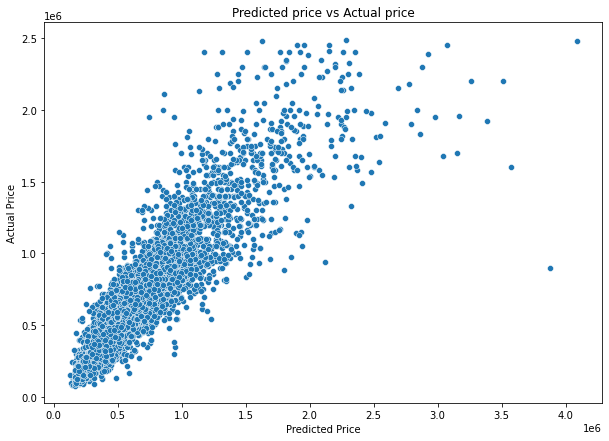

In [184]:
# Predicted price versus the actual price
train_preds = model3.predict(m3_X_train)
fig, ax = plt.subplots(figsize = (10,7))
sns.scatterplot(x=np.exp(train_preds),y= y_train) # reverse the log 
ax.set_title('Predicted price vs Actual price')
ax.set_xlabel('Predicted Price')
ax.set_ylabel('Actual Price')
plt.show()

The above graph shows that my 3rd model had a 85% , Up until 1.5 million USD the model predict accurately, after the model is not that accuratly predicting the sales price.

### 4th Model

In [131]:
# remove collinear variable grade
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

m4_X_test = m3_X_test.drop(['grade'], axis= 1)
m4_X_train = m3_X_train.drop(['grade'], axis= 1)
model4 = LinearRegression()
model4.fit(m4_X_train, y_train_log)

m4_r2_train = model4.score(m4_X_train,y_train_log)
m4_r2_test = model4.score(m4_X_test,y_test_log)
print(model4.score(m4_X_train,y_train_log))
print(model4.score(m4_X_test,y_test_log))


0.8538036224204687
0.8487933495108261


The 4th model captures 84.87% of the variance in price.

In [133]:
m4_X_train

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_basement,yr_built,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3806,-0.397872,-0.806378,0.165538,-0.211872,-0.805067,-0.068375,-0.282225,2.431457,-0.655334,-1.879299,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11484,-0.397872,-1.473193,-0.462412,-0.182662,-0.805067,-0.068375,-0.282225,0.899204,0.728545,-1.060787,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11959,0.676090,1.194064,0.496639,-0.212408,1.019922,-0.068375,-0.282225,-0.633049,-0.655334,1.053704,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16201,-0.397872,0.860657,0.108452,-0.265767,-0.805067,-0.068375,-0.282225,-0.633049,1.143708,0.542134,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11257,-0.397872,-0.139564,-0.085642,-0.292203,-0.805067,-0.068375,1.211098,2.431457,0.636286,-1.504148,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11338,0.676090,-0.806378,-0.645088,-0.290377,1.019922,-0.068375,-0.282225,2.431457,-0.470817,-1.435938,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12023,-1.471835,-0.472971,-0.588002,-0.261604,-0.805067,-0.068375,2.704421,-0.633049,1.005320,-0.617426,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5415,-0.397872,-0.806378,-0.896268,-0.241935,1.019922,-0.068375,-0.282225,0.899204,-0.655334,0.405715,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
863,-0.397872,1.860879,0.473804,-0.287334,1.019922,-0.068375,-0.282225,-0.633049,-0.655334,1.326542,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [134]:
# y hat
y_pred = model4.predict(m4_X_test)
y_pred = np.exp(y_pred)

In [135]:
#MAE
m4_mae = mean_absolute_error(y_pred, y_test)
m4_mae

79489.47761953853

In [136]:
#RMSE
m4_rmse = np.sqrt(mean_squared_error(y_pred, y_test))
m4_rmse

141973.41530054298

mae, the measuring in houseprice is off by 79489 USD (mean avg error), this is a slight increase from the previous model.
rmse, the price of a house is off by 141973 USD, sensitive for outliers

In [137]:
m3_X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_basement,...,x0_98146,x0_98148,x0_98155,x0_98166,x0_98168,x0_98177,x0_98178,x0_98188,x0_98198,x0_98199
3806,-0.397872,-0.806378,0.165538,-0.211872,-0.805067,-0.068375,-0.282225,2.431457,0.310076,-0.655334,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11484,-0.397872,-1.473193,-0.462412,-0.182662,-0.805067,-0.068375,-0.282225,0.899204,-0.559512,0.728545,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11959,0.676090,1.194064,0.496639,-0.212408,1.019922,-0.068375,-0.282225,-0.633049,1.179664,-0.655334,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16201,-0.397872,0.860657,0.108452,-0.265767,-0.805067,-0.068375,-0.282225,-0.633049,-0.559512,1.143708,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11257,-0.397872,-0.139564,-0.085642,-0.292203,-0.805067,-0.068375,1.211098,2.431457,0.310076,0.636286,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [169]:
# coefficient interpretation
list(zip(((np.exp(model4.coef_)-1)*100), np.exp(m4_X_test).iloc[:,0:13].drop(['long' ,'lat'], axis=1)))
#list(zip((((model3.coef_)-1)* 100), m3_X_test.iloc[:,0:13].drop(['long' ,'lat'], axis=1)))
#model.coef_, num_cols.drop(['price', 'long' ,'lat'], axis = 1)))

[(-1.087662298444081, 'bedrooms'),
 (3.508222001071548, 'bathrooms'),
 (34.40081406591737, 'sqft_living'),
 (2.7473417400535105, 'sqft_lot'),
 (-1.9874618535397848, 'floors'),
 (3.065598092304467, 'waterfront'),
 (5.671998435739867, 'view'),
 (3.7907619817989957, 'condition'),
 (-5.407909203194572, 'sqft_basement'),
 (1.8428972878659078, 'yr_built'),
 (7.846426900843517, 'sqft_lot15')]

### 5th Model

In [143]:
# remove year but keep grade
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

m5_X_test = m3_X_test.drop(['year'], axis= 1)
m5_X_train = m3_X_train.drop(['year'], axis= 1)
model5 = LinearRegression()
model5.fit(m5_X_train, y_train_log)
m5_r2_train = model5.score(m5_X_train,y_train_log)
m5_r2_test = model5.score(m5_X_test,y_test_log)
print(model5.score(m5_X_train,y_train_log))
print(model5.score(m5_X_test,y_test_log))

0.8681058346031685
0.8654663163144184


By droping the year feature the R2 score improved. This 5th model capture 86.8% of the the variance in sales price for the train data and 86.5% of the test data.

In [144]:
# y hat
y_pred = model5.predict(m5_X_test)
y_pred = np.exp(y_pred)

In [145]:
#MAE
m5_mae = mean_absolute_error(y_pred, y_test)
m5_mae
# how much the measuring is off
# the measuring in houseprice is off by 76005 USD

73998.09500253294

In [146]:
#RMSE
m5_rmse = np.sqrt(mean_squared_error(y_pred, y_test))
m5_rmse
# how much the measuring is off, outliers
# the price of a house is off by 131456 USD

129220.31086467957

fig = px.scatter(x=y_pred, y =y_test, trendline = 'ols')
fig.show('notebook')

While the R2 impoved, 86,5 % of the variation captured in this model, compared to model 4.
The error also decreased from the previous model for both the MAE and RMSE. MAE - price is off by 73998 USD. Based on the RMSE the price is off by 129220 USD.

### Model Summary

In [188]:
# summary of score from each model
#baseline model with numerical features
print('Baseline Model: ')
print(f'Baseline R2: {base_r2}\n')

# one-hot endcoded zipcode
print('Model2: ')
print(f'Model2 Train R2: {m2_r2_train}')
print(f'Model2 Test R2: {m2_r2_test}')
print(f'Model2 MAE: {m2_mae}')
print(f'Model2 RMSE: {m2_rmse}\n')

#model 3 
print('Model3: ')
print(f'Model3 Train R2: {m3_r2_train}')
print(f'Model3 Test R2: {m3_r2_test}')
print(f'Model3 MAE: {m3_mae}')
print(f'Model3 RMSE: {m3_rmse}\n')

# model 4, removed sqft_above, sft_living15
print('Model4: ')
print(f'Model4 Train R2: {m4_r2_train}')
print(f'Model4 Test R2: {m4_r2_test}')
print(f'Model4 MAE: {m4_mae}')
print(f'Model4 RMSE: {m4_rmse}\n')

# model 5 , removed year feature
print('Model5: ')
print(f'Model5 Test R2: {m5_r2_test}')
print(f'Model5 Test R2: {m5_r2_test}')
print(f'Model5 MAE: {m5_mae}')
print(f'Model5 RMSE: {m5_rmse}')


Baseline Model: 
Baseline R2: 0.569

Model2: 
Model2 Train R2: 0.8734360707928088
Model2 Test R2: 0.8709309058147522
Model2 MAE: 72422.69501229191
Model2 RMSE: 122071.47637004108

Model3: 
Model3 Train R2: 0.8695326533837777
Model3 Test R2: 0.8668419797993704
Model3 MAE: 73588.99742511535
Model3 RMSE: 358.53376532749905

Model4: 
Model4 Train R2: 0.8538036224204687
Model4 Test R2: 0.8487933495108261
Model4 MAE: 79489.47761953853
Model4 RMSE: 141973.41530054298

Model5: 
Model5 Test R2: 0.8654663163144184
Model5 Test R2: 0.8654663163144184
Model5 MAE: 73998.09500253294
Model5 RMSE: 129220.31086467957


### EDA for Recommendation

In [ ]:
# yound couple with a child below 1 year old
# they are looking for a house / apartman in Seatle specific neighborhoods
# they have a budget of 600000 USD
# wouldn't mind if the house is a fixer-upper

In [147]:
# prefered neighborhood
zips = [98117, 98102, 98103, 98115, 98105, 98125, 98133, 98177, 98112, 98119, 98004, 98039, 98122, 98121, 98101, 98104, 98134, 98144]

fixer_upper = pd.DataFrame()
fixer_upper['diff'] = m3_y_pred - y_test.values
fixer_upper['zipcode'] = zipcode
z = fixer_upper.groupby('zipcode').sum()['diff'].sort_values().head(10)
fixer_upper_loc = z.index
common_loc = set(zips).intersection(fixer_upper_loc)
common_loc

{98102, 98103, 98115}

Text(0, 0.5, 'Number of Houses')

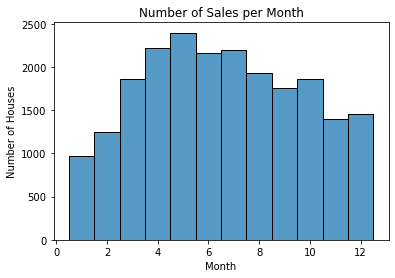

In [148]:
#best time of the year for buying a house
month = df['month'].value_counts()
month = month.sort_index
month
fig, ax = plt.subplots(figsize=(6,4))
sns.histplot(data = df, x= 'month')
ax.set_title('Number of Sales per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Number of Houses')

There is a seasonality in the number of houses available on the market. Based on the graph, the best time of the year to buy is from March to October.

In [189]:
# checking the average price for the selected zipcodes
two_beds = df[df['bedrooms'] == 2]
two_beds = df[(df['zipcode']== 98103)| (df['zipcode'] == 98103) | (df['zipcode'] == 98115)]
#t = two_beds.groupby('zipcode')#['price'].mean()
#t
two_beds.pivot_table(columns = 'zipcode',values='price', aggfunc = 'mean').mean()

zipcode
98103    585048.779070
98115    619944.149228
dtype: float64

In [150]:
# checking the number of two bedroom houses
two_beds['grade'].value_counts()

7     699
8     478
6     124
9     101
10     25
5      14
11      4
12      0
13      0
3       0
4       0
Name: grade, dtype: int64

In [151]:
# checking the number of houses in the selected grades
two_beds['grade'] = two_beds['grade'].astype(int)
two_beds['grade'].value_counts()

7     699
8     478
6     124
9     101
10     25
5      14
11      4
Name: grade, dtype: int64

In [190]:
# minimum price for each zipcode
good_grade = two_beds[(two_beds['grade'] != 5) & (two_beds['grade'] !=6) & (two_beds['grade'] !=11) &(two_beds['grade'] !=12)]
good_grade['grade'].value_counts()
good_grade.pivot_table(columns = 'zipcode',values='price',aggfunc = 'min').min()

zipcode
98103    238000.0
98115    200000.0
dtype: float64

In [191]:
#map for target 
fig = px.scatter_mapbox(good_grade.loc[good_grade['price'] <= 600000], lat='lat', lon='long', zoom= 10, color = 'price')
fig.update_layout(mapbox_style='open-street-map')
fig.show()

